# 个人绘图工具`ysy_plot_utils`

个人使用的绘图工具  
作者：GitHub@pifuyuini
日期：20250406

---

## 功能

这个模块暂时有三个作用，第一个作用，快速设置绘图风格，一方面可以快速设置采用流萤主题配色的个人偏好风格，另一方面可以快速设置具有“Science”期刊中图片特色的科研绘图风格。第二个作用，生成流萤主题的配色。第三个作用，可以快速绘制最一般最常用的绘图，将代码从数行浓缩为一行。

**更新注意**

注意，目前v1.3版本更新了新的主题使用功能，此版本后***不建议直接使用原`settings()`功能，具体新用法见下***。

#  使用示例

## 说明

这个说明应该配合下面的具体代码使用。

**这个说明写于版本v1.0**

首先导入必要的模块，然后用```plt.rcParams.update```进行绘图风格设置。特别注意两点，模块内的代码被修改后，需要**重启内核**；风格设置由```ypu.ysy_settings```切换为```ypu.science_settings```后，也需要**重启内核**（注意当前版本用这个风格时，```ypu.plot```的```scatter```绘制功能会出问题）。此外，风格设置有一些参数可以传递，具体见说明文档。第二段代码展示了设置风格后的绘图效果。

然后，我们可以用```ypu.firefly```来获得流萤主题颜色，函数具体用法可以参考说明文档。第三和第四段代码展示了一些具体用法。

最后，```ypu.plot```给出了一个替代我们最常用的```plt.plot```的快捷方法（指的是绘制第二段代码那样的图）。用法上，可以单一绘图，参数传递与```plt.plot```类似，但是强制要求传递```legend_name```参数。绘制多个图时，需在参数```y```的位置传递一个包含要绘制的各个y的**元组**（预计新版本更新后，会兼容数组类型），同时参数```legend_name```也要传递对应长度的由字符串构成的**元组**。其它参数可以参考说明文档。此外，要绘制散点图，可以将```plot_type```改为```'scatter'```。第五和第六段代码给出了一些示例。

In [1]:
# 导入必要的库
import numpy as np
import matplotlib.pyplot as plt
import ysy_plot_utils as ypu

# 绘图风格设置
plt.rcParams.update(ypu.ysy_settings())

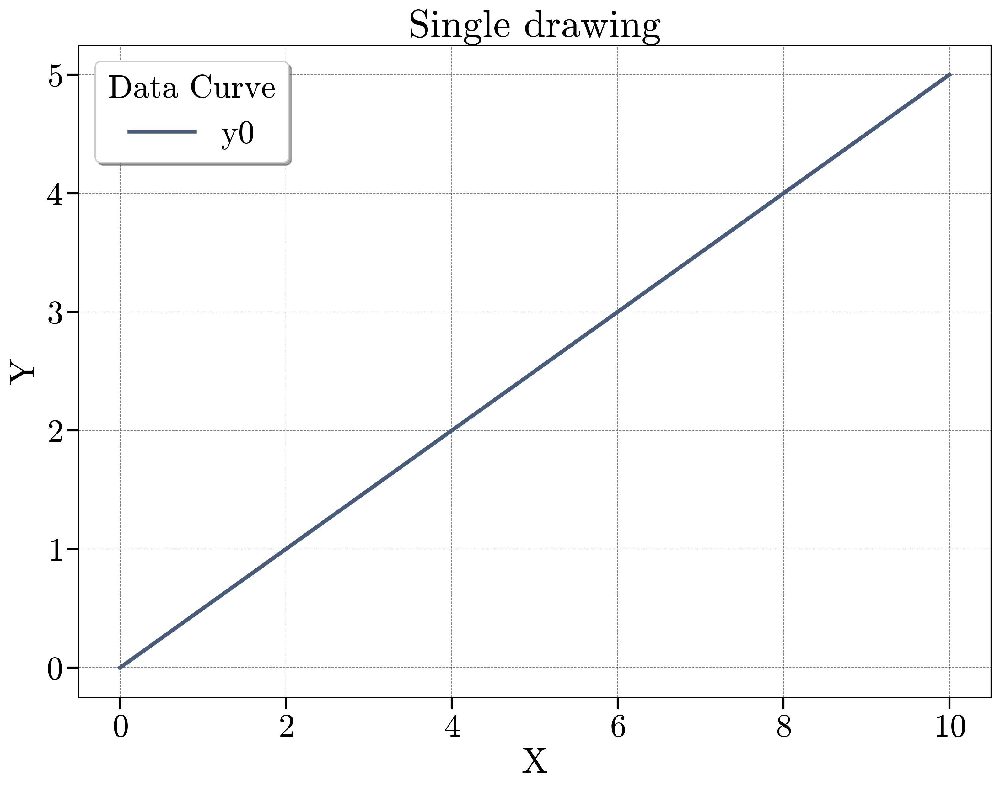

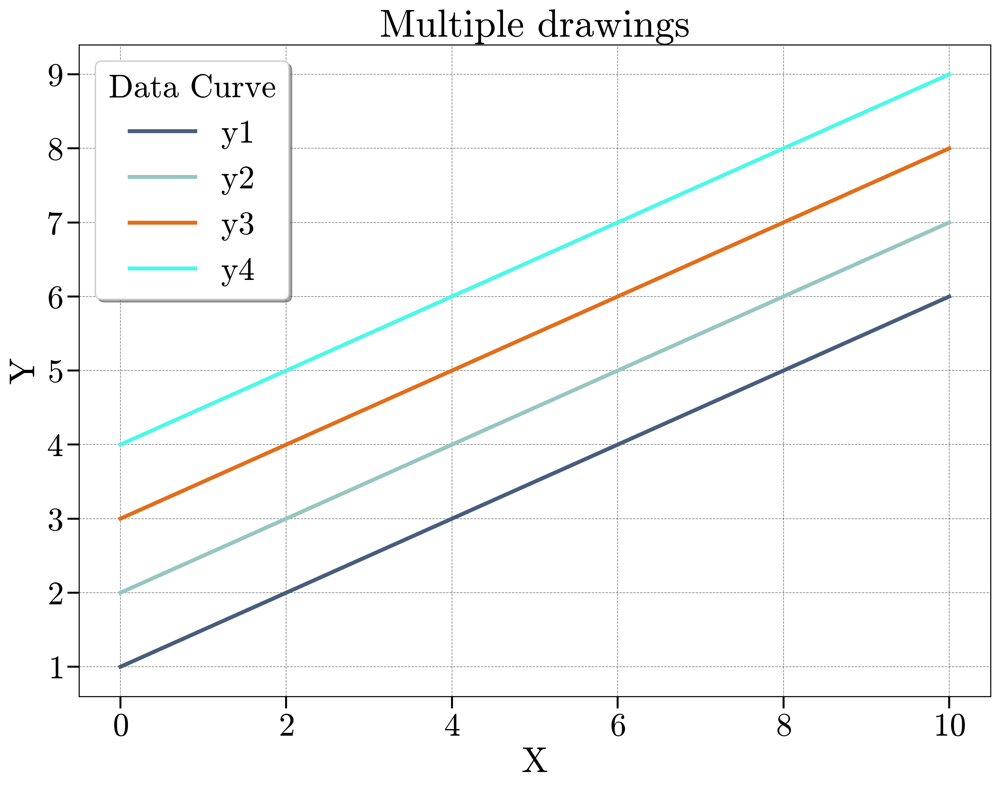

In [2]:
# 生成数据
x = np.linspace(0, 10, 1000)
y0 = 0.5 * x
y1 = 0.5 * x + 1
y2 = 0.5 * x + 2
y3 = 0.5 * x + 3
y4 = 0.5 * x + 4

# 单一绘图
plt.figure()
plt.plot(x, y0, label='y0')
plt.legend(title='Data Curve')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Single drawing')
plt.show()

# 多个绘图
plt.figure()
plt.plot(x, y1, label='y1')
plt.plot(x, y2, label='y2')
plt.plot(x, y3, label='y3')
plt.plot(x, y4, label='y4')
plt.legend(title='Data Curve')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Multiple drawings')
plt.show()

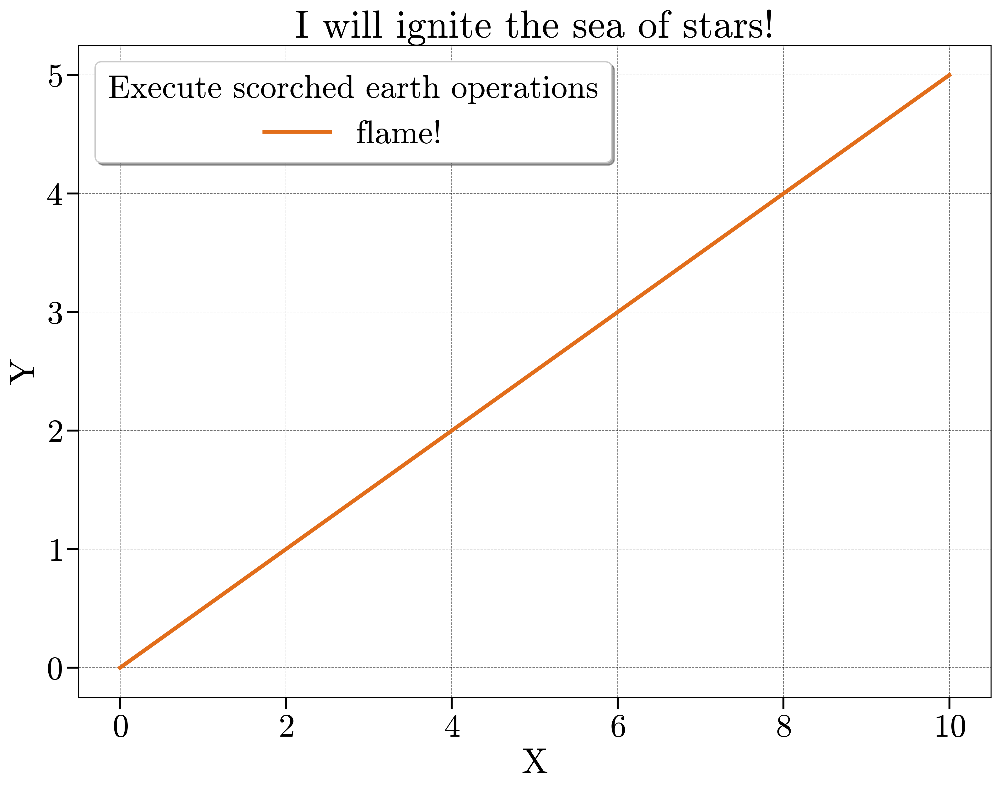

In [3]:
# 获得流萤主题配色中的某个颜色（例如将上面第一个绘图的线条改为萨姆火焰的颜色）
plt.figure()
plt.plot(x, y0, label='flame!', color=ypu.firefly('fred'))
plt.legend(title='Execute scorched earth operations')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('I will ignite the sea of stars!')
plt.show()

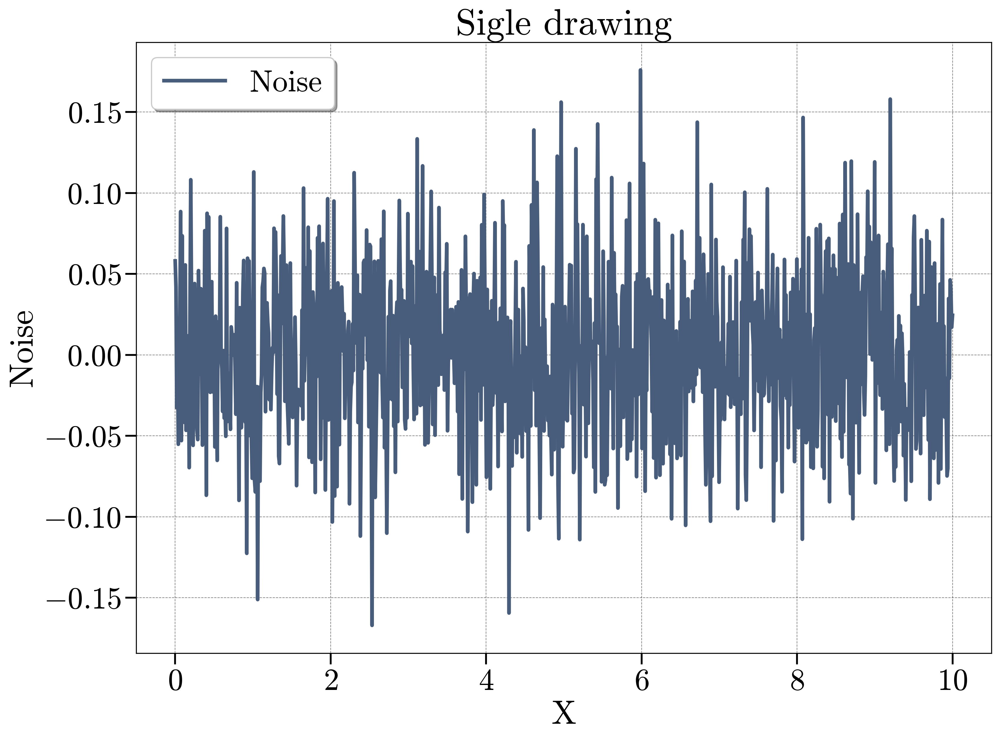

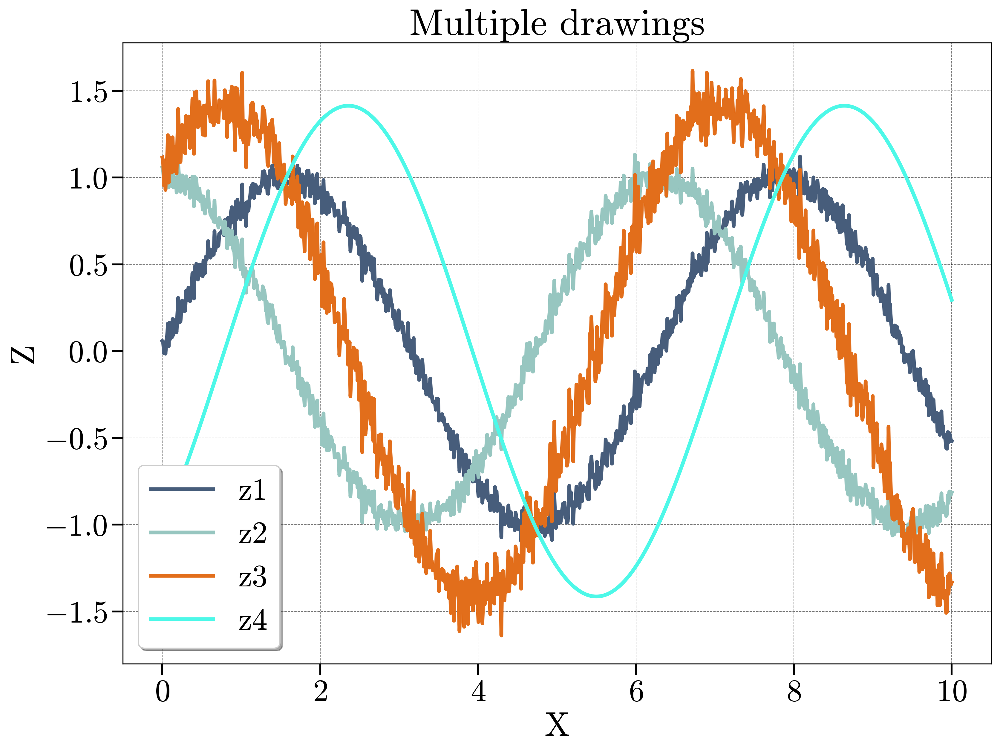

In [4]:
# ypu.plot使用示例

# 单一绘图
noise = np.random.normal(0, 0.05, len(x))
ypu.plot(x, noise, 'Noise', plot_title='Sigle drawing', y_label='Noise')

# 多个绘图
z1 = np.sin(x) + noise
z2 = np.cos(x) + noise
z3 = z1 + z2
z4 = z1 - z2
ypu.plot(x, (z1, z2, z3, z4), ('z1', 'z2', 'z3', 'z4'), plot_title='Multiple drawings', y_label='Z')

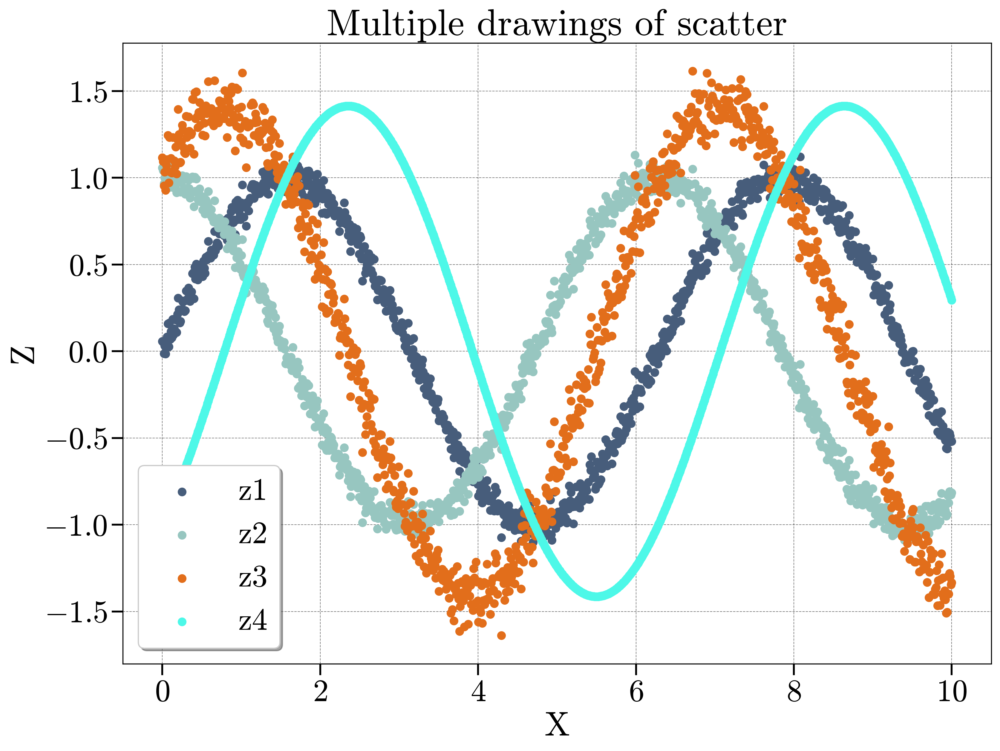

In [5]:
# 用ypu.plot绘制scatter
ypu.plot(x, (z1, z2, z3, z4), ('z1', 'z2', 'z3', 'z4'), plot_title='Multiple drawings of scatter', y_label='Z', plot_type='scatter')

## 1.2版本新增功能

1. 全新的流萤主题配色
2. 绘制数据点的功能

详见以下演示。

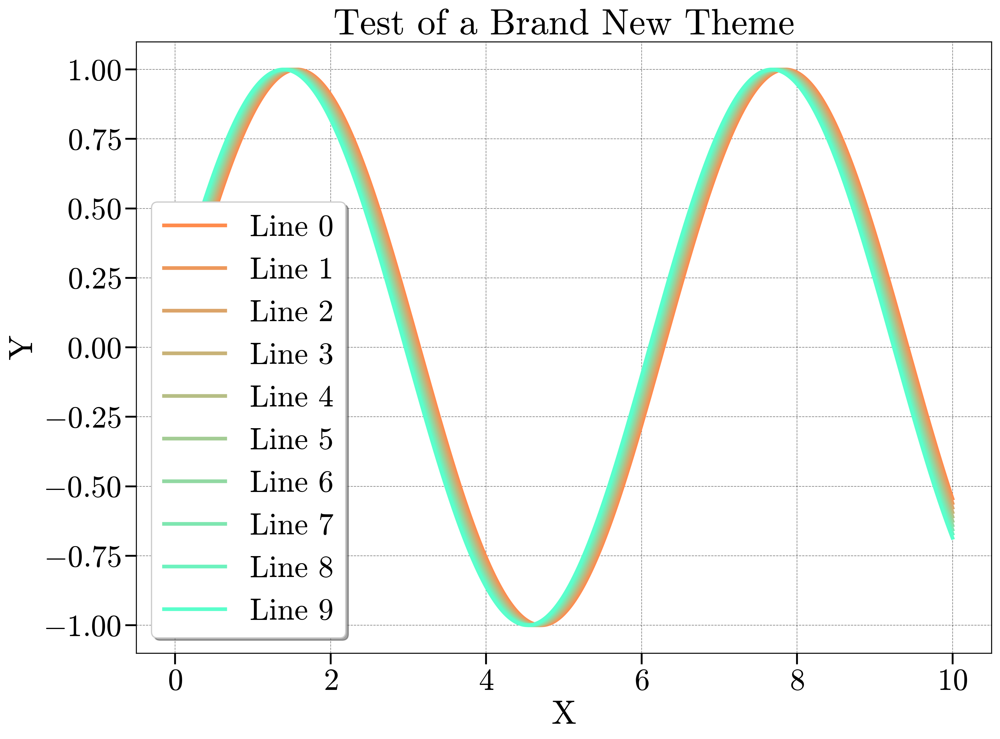

In [6]:
# 更新颜色设置并获得一个cmap
liuyin_cmap = ypu.liuyin_color_theme(cmap_or_cycle='cmap')

# 配色展示

ypu.plot(x, tuple(np.sin(x + 0.02 * i) for i in range(10)), tuple('Line ' + str(i) for i in range(10)), 'Test of a Brand New Theme')


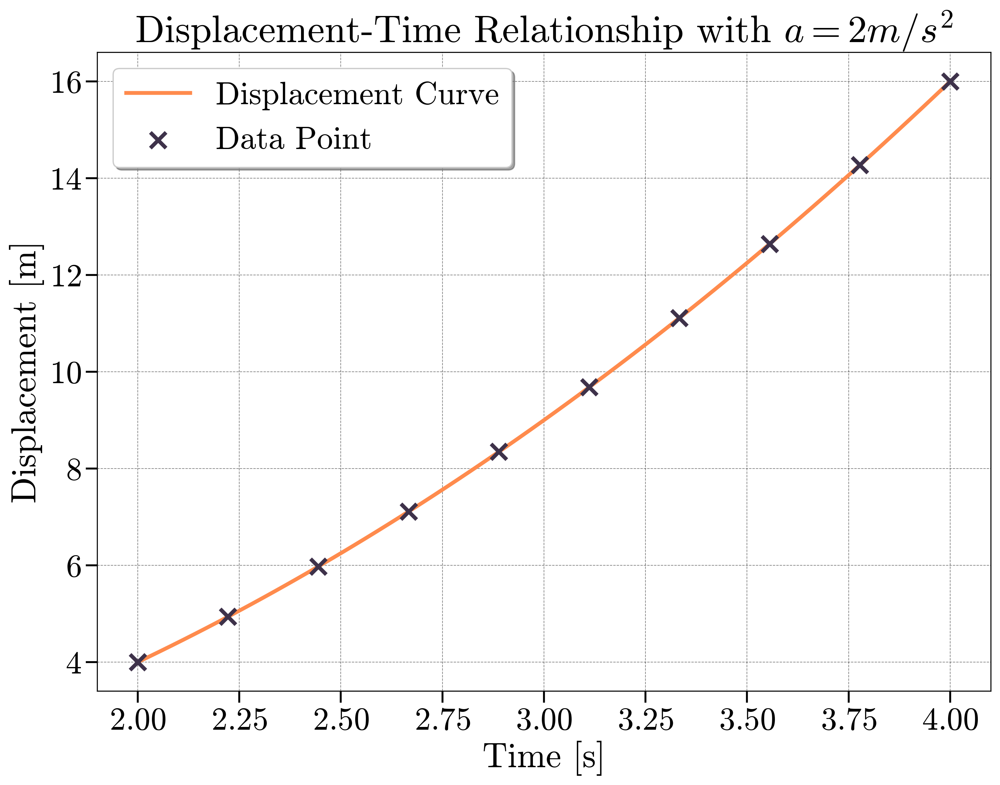

In [7]:
# 展示绘制数据点的功能
time = np.linspace(2, 4, 10)
displacement = time**2
velocity = 2 * time
time_fine = np.linspace(2, 4, 1000)
displace_fine = time_fine**2

ypu.plot(
    time_fine, displace_fine, 'Displacement Curve', 
    plot_title='Displacement-Time Relationship with $a=2m/s^2$', 
    data_point=(time, displacement), 
    x_label='Time [s]', 
    y_label='Displacement [m]'
)

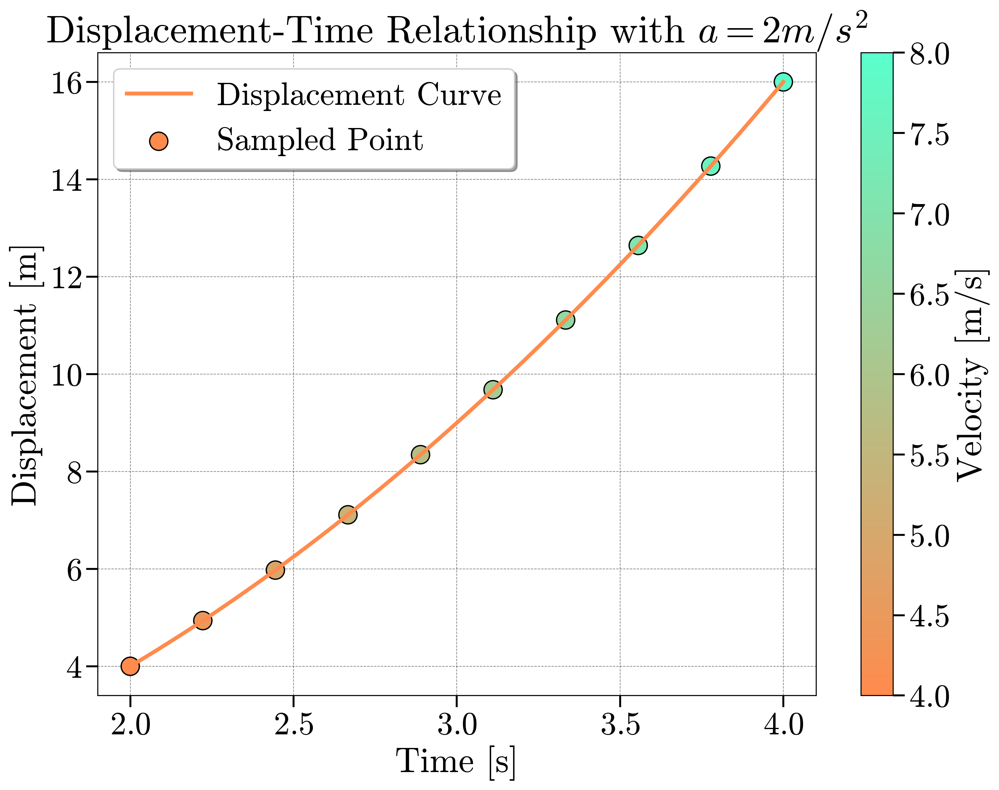

In [8]:
# 以下给出了绘制带colorbar的scatter的参考
plt.figure()
plt.plot(time_fine, displace_fine, label='Displacement Curve')
scatter_plot = plt.scatter(time, displacement, c=velocity, cmap=liuyin_cmap, s=200, edgecolor='black', label='Sampled Point')
plt.colorbar(scatter_plot, label='Velocity [m/s]')
plt.legend()
plt.xlabel('Time [s]')
plt.ylabel('Displacement [m]')
plt.title('Displacement-Time Relationship with $a=2m/s^2$')
plt.show()

## 1.3更新+主题全新用法

此版本后的主题设置均推荐以下方式。  

以下代码独立于上述代码运行。  

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import ysy_plot_utils as ypu

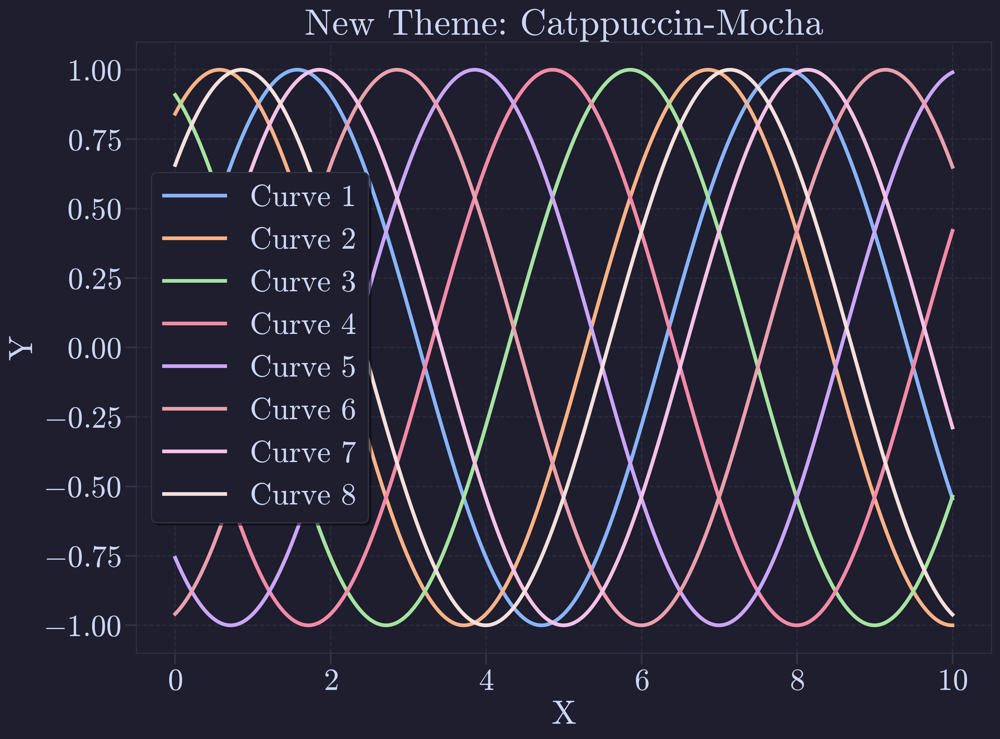

In [ ]:
# 使用新的样式加载方式绘图
x = np.linspace(0, 10 ,1000)
y = []
y_name = []
for i in range(0, 8):
    y.append(np.sin(x + i))
    y_name.append('Curve ' + str(i+1))
# 注意下面这个加载格式
with ypu.temp_style(["ysy_common", "catppuccin_mocha"]):
    ypu.plot(
        x, y, y_name, 
        'New Theme: Catppuccin-Mocha'
    )

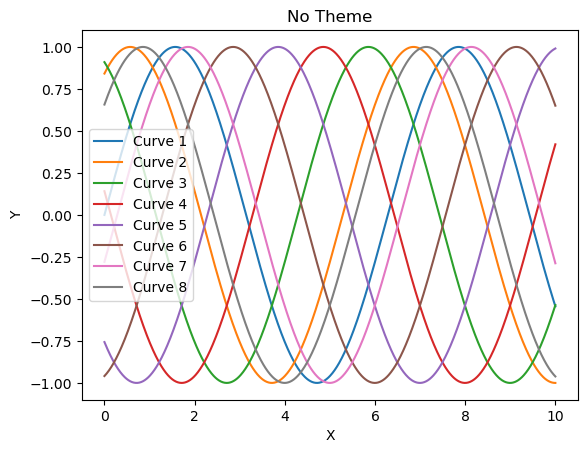

In [ ]:
# 如果不使用加载器新主题
ypu.plot(
    x, y, y_name, 
    'No Theme'
)

### 样式简介

#### 图形风格类样式（Plot Styling）

- `ysy_common` --旗舰级科研图风格：为高质量论文插图和科研展示而生，线条粗、字号大、排布稳重，细节考究，呈现出一种**“科研豪华风”**，适用于学术场合的黄金标准。
- `ysy_jupyter` --轻量级交互风格：专为 Notebook 环境定制，保留 `ysy_common` 的严谨感，又减少视觉压迫，适配交互调试，灵动清爽，适合快速实验与结果展示。
- `sci_common` --PRL/Science 标准模板：致敬顶级期刊的图像审美，紧凑布局、纤细线条、小字号、无网格，具有浓厚的**“出版即刻感”**，让你的图一眼看上去就像来自 Nature。
- `science` --严谨中的精致工艺：内向坐标、刻度线统一、边框清晰、无装饰图例——这是科研图的“仪表之规”，一丝不苟，适合 Science 期刊投稿风格。

#### 颜色主题类样式（Color Themes）

- `catppuccin_mocha` --夜色中的温柔霓虹：深紫夜幕下的柔光色彩，柔美不刺眼，低对比高舒适，像在夜晚打着小台灯审阅图表，是科研风格和 UI 审美的完美交融。
- `catppuccin_latte` --晨光初洒的舒适系色板：柔和、明快、无压感，主打“有点可爱但又不轻浮”，适合浅色背景网页或文档输出，轻盈、优雅、亲和力极高。
- `catppuccin_farppe` --温润却神秘的深调梦境：自带柔光效果的暗色主题，深灰背景与中性色调交织，色彩层次丰富却不过分张扬，如夜幕下的精致 UI 面板，适合幻灯片和深色站点。
- `ysy_firefly_1` --沉静中跳动的萤火之光：主色沉稳（灰蓝、灰绿、紫黑），强调色亮丽而有格调（萤光橙、青绿），在大面积暗色或中性背景中，形成视觉“萤火虫般跳跃的节奏”。
- `science_color` --科研界的黄金配色法则：蓝绿橙红紫黑灰，饱和度适中、分辨度高，是顶级论文中最常见的调色板，可靠、专业、打印友好，是“科研配色的六字箴言”。
- `nord_dark` --极夜之下的极地光谱：深邃蓝灰底色，搭配北极光般的冷艳色彩，干净、沉静又科技感十足，仿佛你正在极地实验站远程遥控观测数据。
- `nord_light` --清晨冰原上的理性色调：浅灰白背景，搭配冰蓝与极光绿色系，色彩通透，线条纯净，兼具简约美学与图像可读性，适合论文白底输出或简约设计风格网站。
- `school_light` --为学院主题做配色。

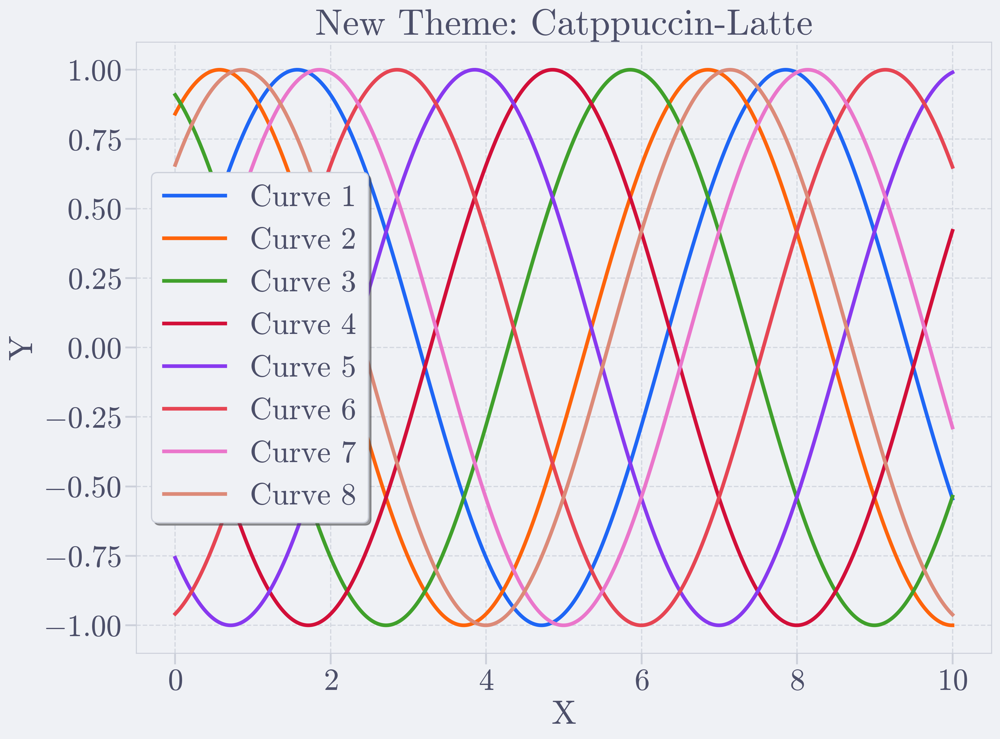

In [4]:
# 可以别的看看新主题
## 上面那个是梦琪摩卡

## 梦琪拿铁
with ypu.temp_style(["ysy_common", "catppuccin_latte"]):
    ypu.plot(
        x, y, y_name, 
        'New Theme: Catppuccin-Latte'
    )

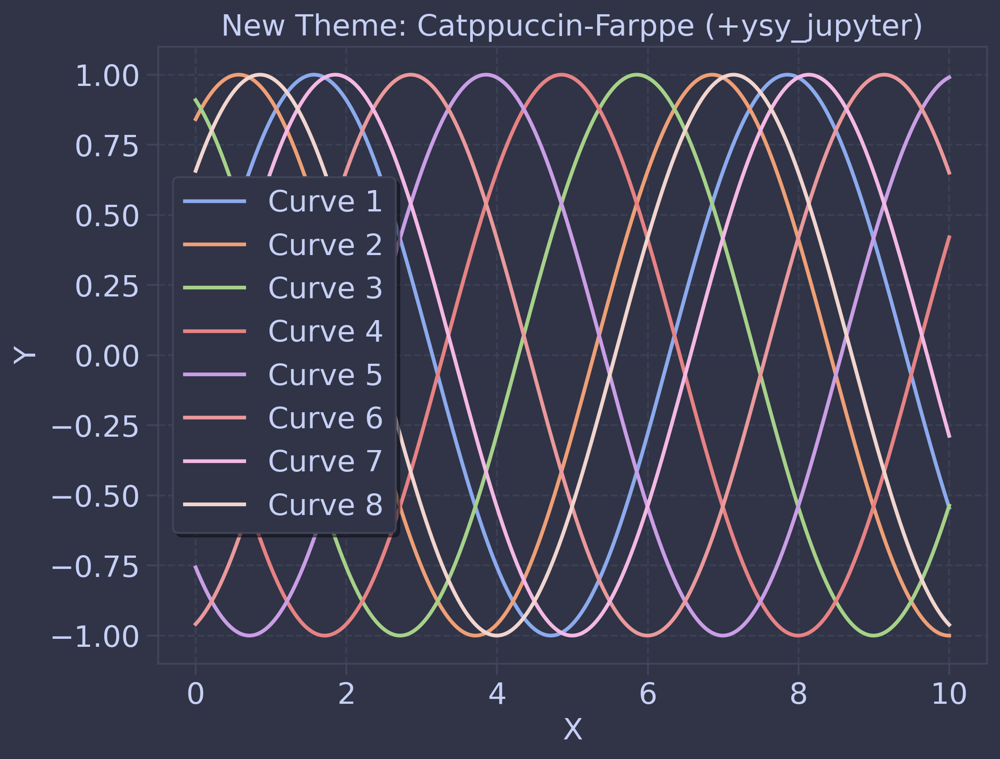

In [ ]:
# ysy_jupyter+梦琪冰沙
with ypu.temp_style(["ysy_jupyter", "catppuccin_farppe"]):
    ypu.plot(
        x, y, y_name, 
        'New Theme: Catppuccin-Farppe (+ysy_jupyter)'
    )

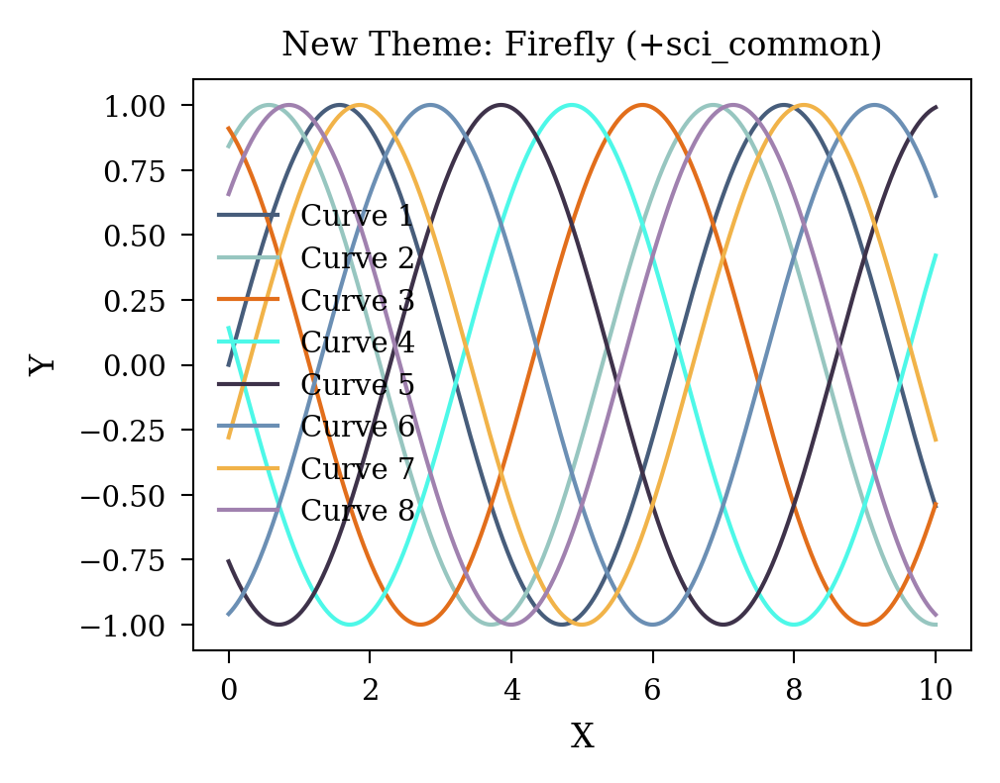

In [ ]:
# SCI+流萤配色
with ypu.temp_style(["sci_common", "ysy_firefly_1"]):
    ypu.plot(
        x, y, y_name, 
        'New Theme: Firefly (+sci_common)'
    )

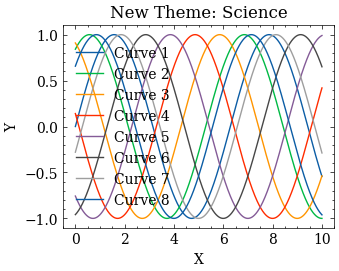

In [7]:
# 科研风
with ypu.temp_style(["science", "science_color"]):
    ypu.plot(
        x, y, y_name, 
        'New Theme: Science'
    )

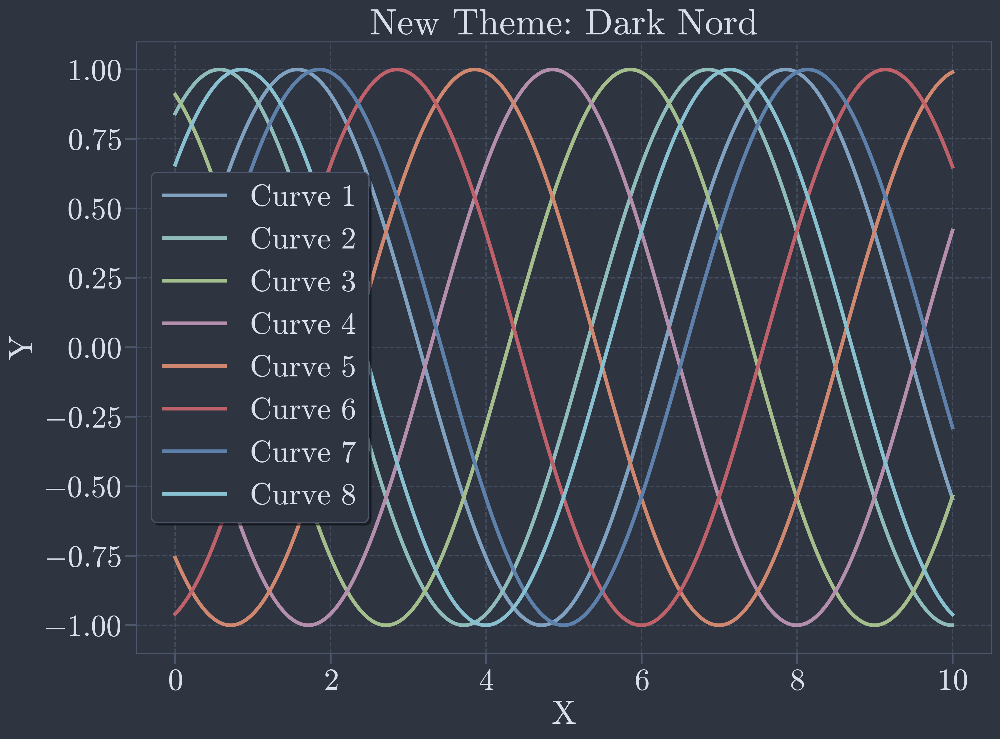

In [ ]:
# Nord深色
with ypu.temp_style(["ysy_common", "nord_dark"]):
    ypu.plot(
        x, y, y_name, 
        'New Theme: Dark Nord'
    )

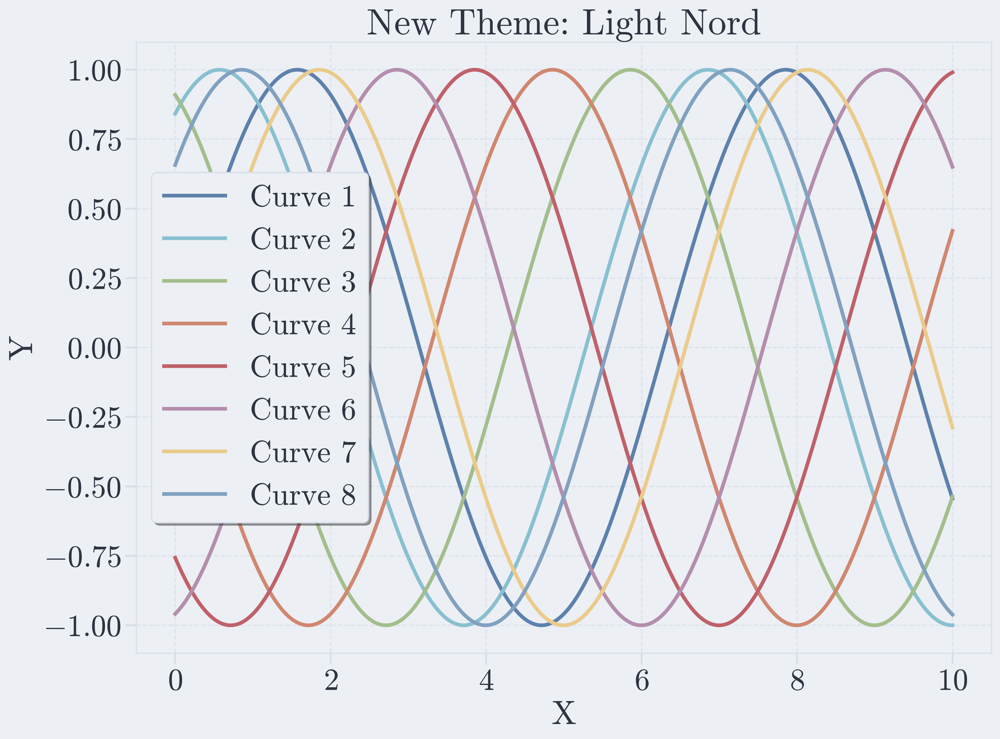

In [ ]:
# 浅色Nord
with ypu.temp_style(["ysy_common", "nord_light"]):
    ypu.plot(
        x, y, y_name, 
        'New Theme: Light Nord'
    )

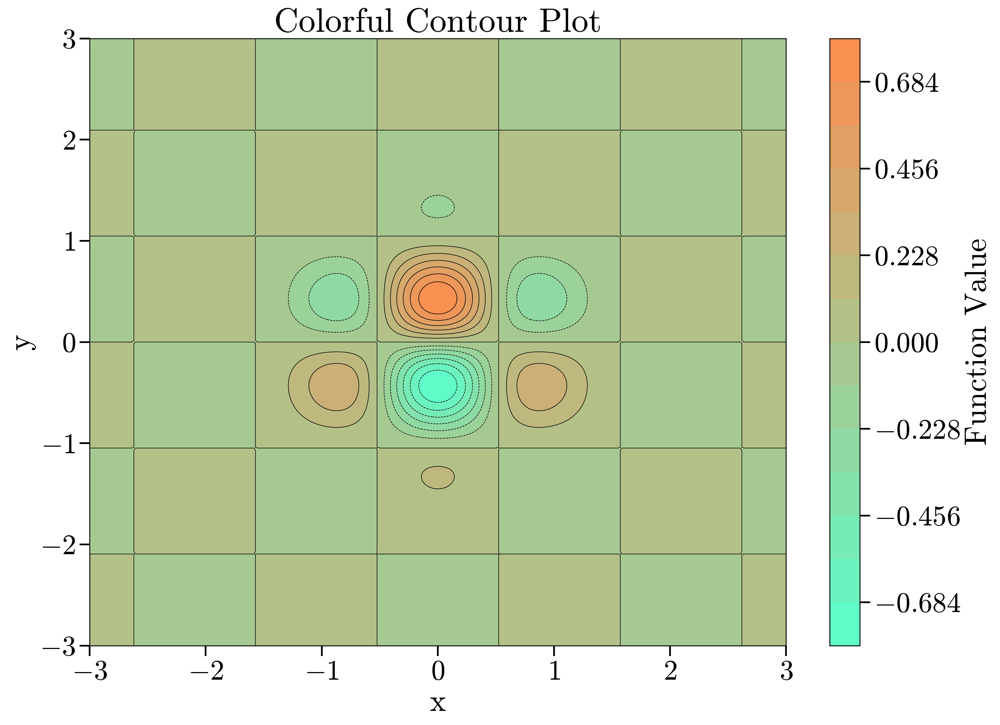

In [ ]:
# 更新后的流萤cmap（新增reverse功能）
grid_1d = np.linspace(-3, 3, 200)
X, Y = np.meshgrid(grid_1d, grid_1d)
Z = np.exp(-X**2 - Y**2) * np.cos(3*X) * np.sin(3*Y)
levels = np.linspace(Z.min(), Z.max(), 15)
with ypu.temp_style(['ysy_common', 'ysy_firefly_1']):
    plt.figure(dpi=300)
    contour = plt.contourf(X, Y, Z, levels=levels, cmap=ypu.firefly_color_theme(cmap_or_cycle='cmap', reverse=True))
    plt.contour(X, Y, Z, levels=levels, colors='k', linewidths=0.5)
    cbar = plt.colorbar(contour)
    cbar.set_label('Function Value')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Colorful Contour Plot')
    plt.tight_layout()
    plt.show()

## 1.4.0更新：`ysy_academic`样式

适配 YsyClass 的布局排版。

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import ysy_plot_utils as ypu

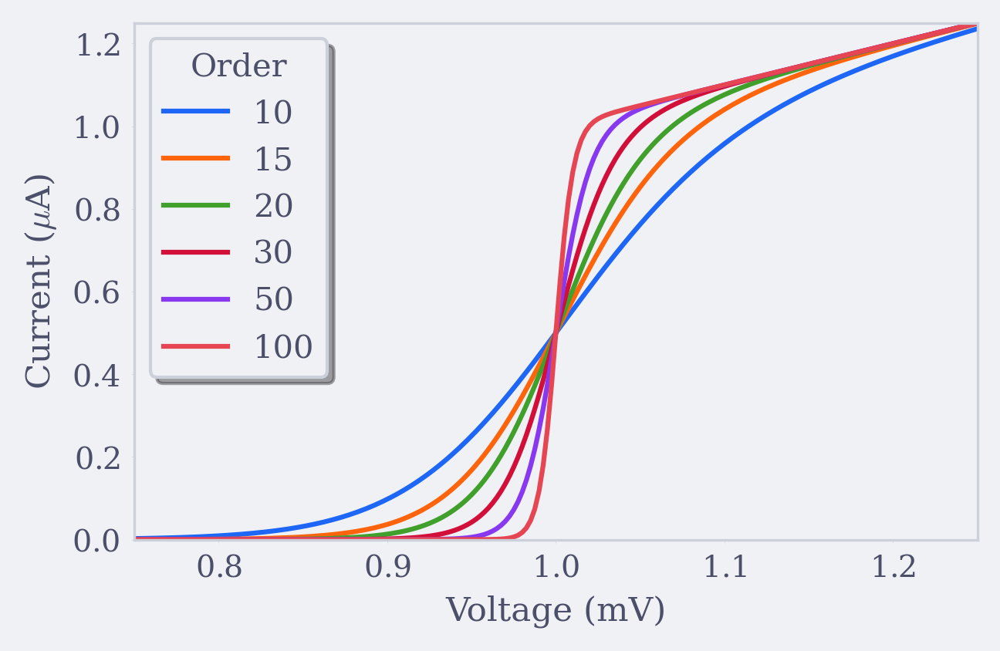

In [2]:
with ypu.temp_style(["ysy_academic", "catppuccin_latte"]):
    def model(x, p): 
        return x ** (2 * p + 1) / (1 + x ** (2 * p))
    x = np.linspace(0.75, 1.25, 201)
    fig, ax = plt.subplots()
    for p in [10, 15, 20, 30, 50, 100]:      
        ax.plot(x, model(x, p), label=p)
    ax.legend(title='Order')
    ax.set(xlabel='Voltage (mV)')
    ax.set(ylabel='Current ($\mu$A)')
    ax.autoscale(tight=True)
    plt.show()

## 1.5.0更新

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import ysy_plot_utils as ypu

In [2]:
# 打印内置主题目录
ypu.print_preset_styles()

=== Recommended Loading Format ===
with ypu.temp_style(["ysy_academic", "sky"]):

=== Drawing Layout ===
ysy_common, ysy_jupyter, sci_common, science(recommended), ysy_academic(recommended)

=== Color Themes ===
catppuccin_mocha(dark, recommended), 
catppuccin_latte(recommended), 
ysy_firefly_1(lightweight), 
science_color(lightweight), 
catppuccin_farppe(dark), 
nord_light, nord_dark(dark), 
school_light, 
sky(lightweight, recommended), 
ysy_firefly_2(grayscale, lightweight), 
cold_nature(lightweight), 
mondrian_dunghuang(lightweight), 
sky2(lightweight)


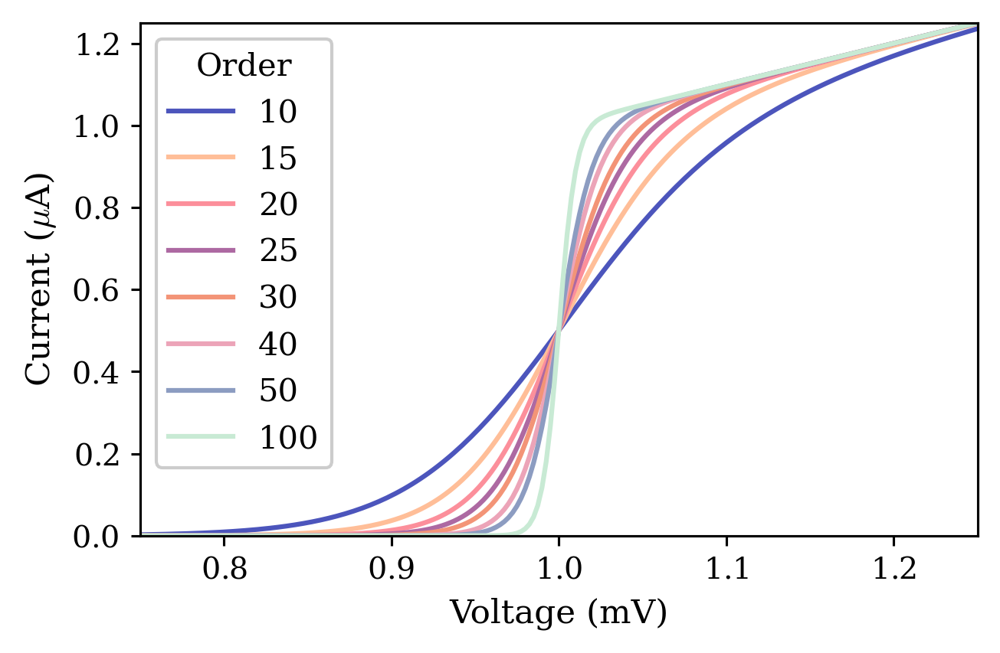

In [3]:
# 新增主题示例
with ypu.temp_style(["ysy_academic", "sky"]):
    def model(x, p): 
        return x ** (2 * p + 1) / (1 + x ** (2 * p))
    x = np.linspace(0.75, 1.25, 201)
    fig, ax = plt.subplots()
    for p in [10, 15, 20, 25, 30, 40, 50, 100]:      
        ax.plot(x, model(x, p), label=p)
    ax.legend(title='Order')
    ax.set(xlabel='Voltage (mV)')
    ax.set(ylabel='Current ($\mu$A)')
    ax.autoscale(tight=True)
    plt.show()